In [1]:
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
from pandas.plotting import scatter_matrix

In [2]:
benin_data = pd.read_csv('../data/benin-malanville.csv')
sierraleone_data = pd.read_csv('../data/sierraleone-bumbuna.csv')
togo_data = pd.read_csv('../data/togo-dapaong_qc.csv')

In [3]:
def calculate_summery_statics(df,country):
    df = df.head(10)

    df = df.select_dtypes(include=['number'])
    print(f'\nSummery statics for {country}:')
    print(df.describe())
    print('\nMean:\n',df.mean())
    print('\nMedian:\n',df.median())
    print('\nStandart Deviation:\n',df.std())
    print('\nVariance:\n',df.var())
    print('\nSkewness:\n',df.skew())
    print('\nKurtosis:\n',df.kurtosis())
    

In [4]:
calculate_summery_statics(benin_data,'Benin')
calculate_summery_statics(sierraleone_data,'Sierra Leone')
calculate_summery_statics(togo_data,'Togo')


Summery statics for Benin:
             GHI        DNI        DHI  ModA  ModB  Tamb         RH  \
count  10.000000  10.000000  10.000000  10.0  10.0  10.0  10.000000   
mean   -1.050000  -0.130000  -1.030000   0.0   0.0  26.2  93.570000   
std     0.070711   0.048305   0.048305   0.0   0.0   0.0   0.176698   
min    -1.200000  -0.200000  -1.100000   0.0   0.0  26.2  93.300000   
25%    -1.100000  -0.175000  -1.075000   0.0   0.0  26.2  93.450000   
50%    -1.000000  -0.100000  -1.000000   0.0   0.0  26.2  93.600000   
75%    -1.000000  -0.100000  -1.000000   0.0   0.0  26.2  93.700000   
max    -1.000000  -0.100000  -1.000000   0.0   0.0  26.2  93.800000   

              WS     WSgust   WSstdev          WD  WDstdev          BP  \
count  10.000000  10.000000  10.00000   10.000000  10.0000   10.000000   
mean    0.220000   0.680000   0.30000   96.520000   1.7200  997.200000   
std     0.248551   0.470933   0.23094   51.059329   2.0938    0.421637   
min     0.000000   0.000000   0.0000

In [5]:
def check_missing_values(df,country):
    print(f'Missing values in {country}:\n')
    missing_values = df.isnull().sum()
    print(missing_values)

In [6]:
check_missing_values(benin_data,'Benin')
check_missing_values(sierraleone_data,'Sierra Leone')
check_missing_values(togo_data,'Togo')

Missing values in Benin:

Timestamp             0
GHI                   0
DNI                   0
DHI                   0
ModA                  0
ModB                  0
Tamb                  0
RH                    0
WS                    0
WSgust                0
WSstdev               0
WD                    0
WDstdev               0
BP                    0
Cleaning              0
Precipitation         0
TModA                 0
TModB                 0
Comments         525600
dtype: int64
Missing values in Sierra Leone:

Timestamp             0
GHI                   0
DNI                   0
DHI                   0
ModA                  0
ModB                  0
Tamb                  0
RH                    0
WS                    0
WSgust                0
WSstdev               0
WD                    0
WDstdev               0
BP                    0
Cleaning              0
Precipitation         0
TModA                 0
TModB                 0
Comments         525600
dtype: int64
Mis

In [7]:
def check_outliers(df,country):
    print(f'Outliers in {country}:\n')
    df = df[['ModA','ModB','WS','WSgust']]
    Q1 = df.quantile(0.25)
    Q3 = df.quantile(0.75)
    IQR = Q3 - Q1
    outliers = ((df < (Q1 - 1.5 * IQR)) | (df > (Q3 + 1.5 * IQR))).sum()
    print(outliers)

In [8]:
check_outliers(benin_data,'Benin')
check_outliers(sierraleone_data,'Sierra Leone')
check_outliers(togo_data,'Togo')

Outliers in Benin:

ModA        98
ModB       240
WS        6717
WSgust    5368
dtype: int64
Outliers in Sierra Leone:

ModA      21017
ModB      20613
WS         3169
WSgust     3665
dtype: int64
Outliers in Togo:

ModA      1237
ModB      1537
WS        8708
WSgust    7377
dtype: int64


In [9]:
def check_negative_values(df,country):
    print(f'Negative values in {country}:\n')
    df = df[['GHI','DNI','DHI']]
    negative_values = (df < 0).sum()
    print(negative_values)

In [10]:
check_negative_values(benin_data,'Benin')
check_negative_values(sierraleone_data,'Sierra Leone')
check_negative_values(togo_data,'Togo')

Negative values in Benin:

GHI    258847
DNI    275987
DHI    259182
dtype: int64
Negative values in Sierra Leone:

GHI    261135
DNI    266352
DHI    263128
dtype: int64
Negative values in Togo:

GHI    257385
DNI         0
DHI         0
dtype: int64


In [11]:
benin_data['time'] = pd.to_datetime(benin_data['Timestamp'])
sierraleone_data['time'] = pd.to_datetime(sierraleone_data['Timestamp'])
togo_data['time'] = pd.to_datetime(togo_data['Timestamp'])

In [12]:
def plot_time_series(df,country):
    plt.figure(figsize=(14,8))
    df = df.head(1000)
    sns.lineplot(data=df,x='Timestamp',y='GHI',label=country)

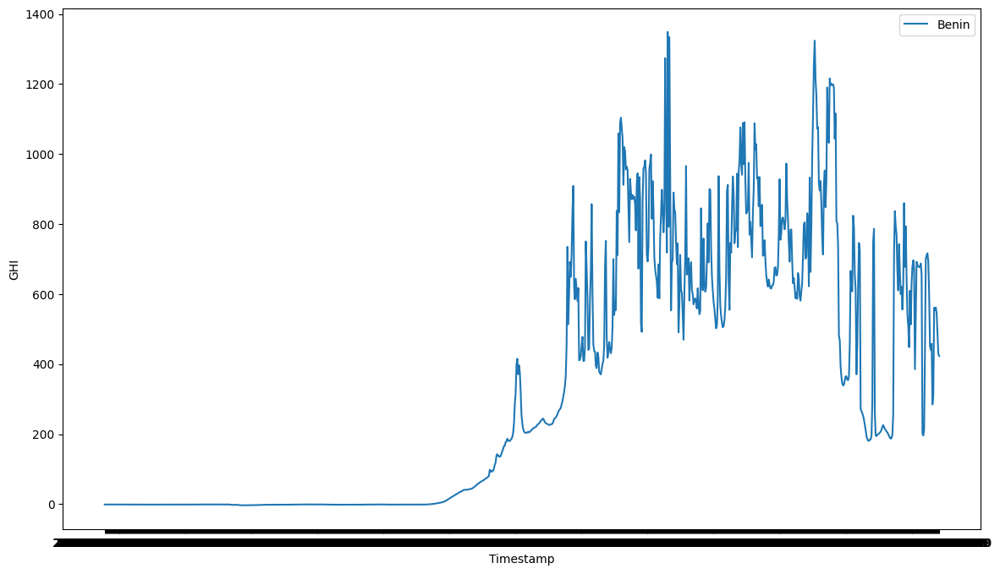

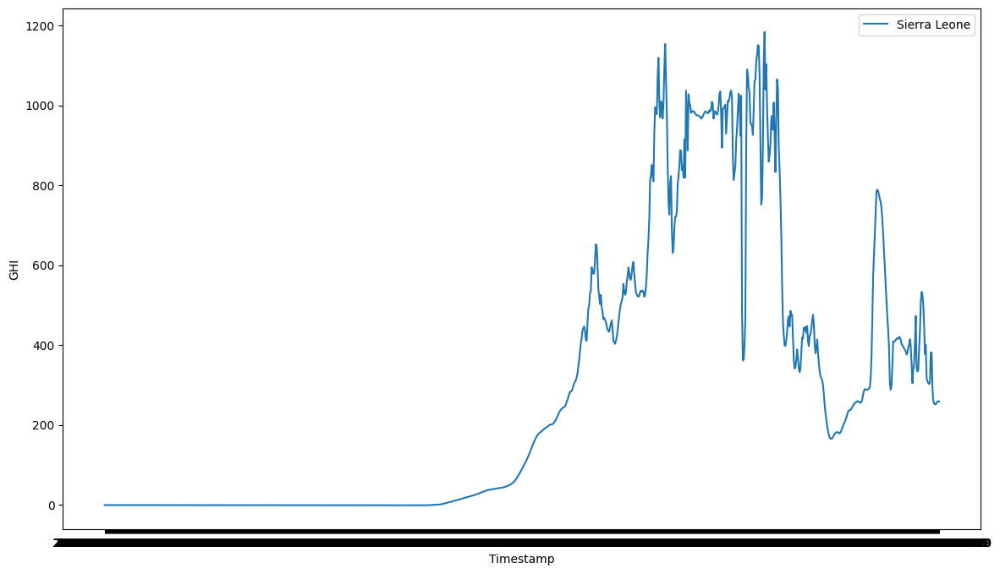

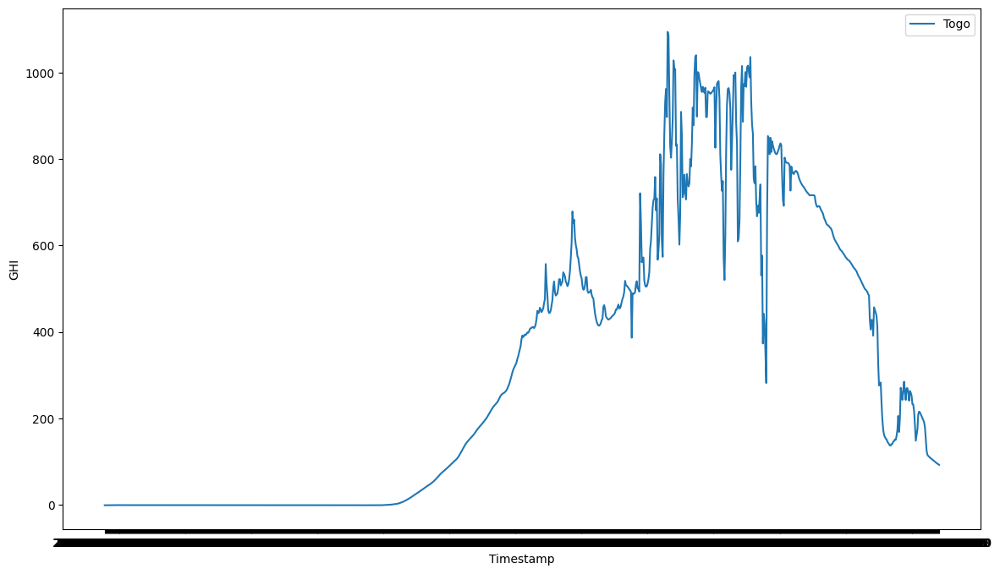

In [13]:
plot_time_series(benin_data,'Benin')
plot_time_series(sierraleone_data,'Sierra Leone')
plot_time_series(togo_data,'Togo')

In [14]:
def plot_area(data, title):
    data['Timestamp'] = pd.to_datetime(data['Timestamp'])

    data.sort_values('Timestamp', inplace=True)

    plt.figure(figsize=(10, 6))

    plt.fill_between(data['Timestamp'], data['GHI'], color="lightblue", alpha=0.4)
    plt.fill_between(data['Timestamp'], data['DNI'], color="lightcoral", alpha=0.4)
    plt.fill_between(data['Timestamp'], data['DHI'], color="lightgreen", alpha=0.4)

    plt.plot(data['Timestamp'], data['GHI'], color="blue", alpha=0.8, label='GHI')
    plt.plot(data['Timestamp'], data['DNI'], color="red", alpha=0.8, label='DNI')
    plt.plot(data['Timestamp'], data['DHI'], color="green", alpha=0.8, label='DHI')

    plt.legend()
    plt.title(title)
    plt.xlabel('Timestamp')
    plt.ylabel('Values')
    plt.show()




/home/abrham/Documents/kifiya/week0/myenv/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


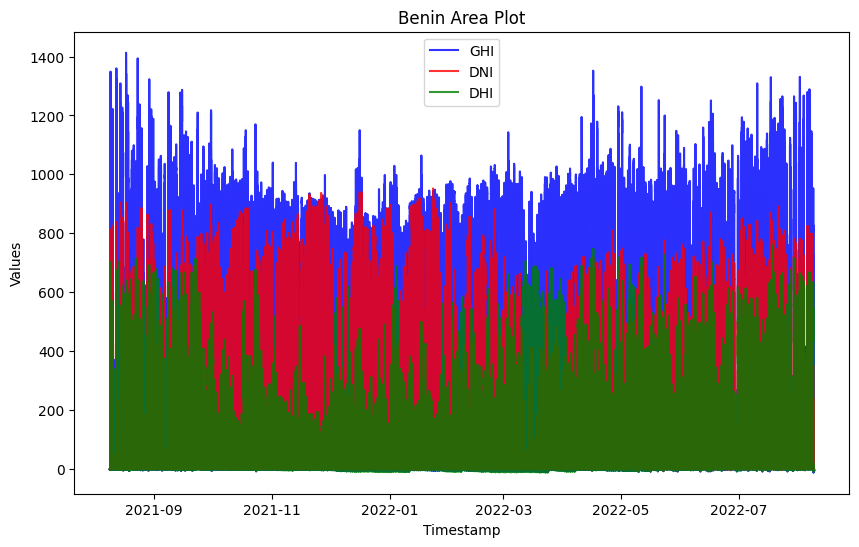

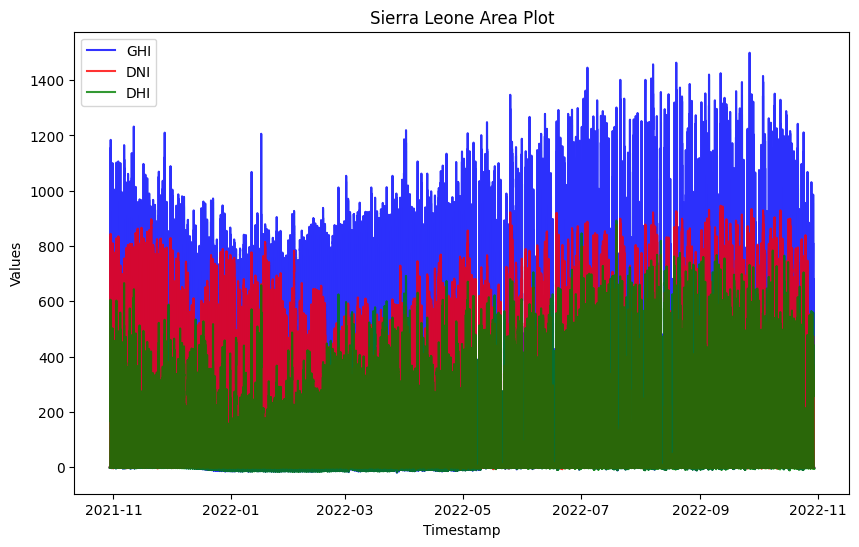

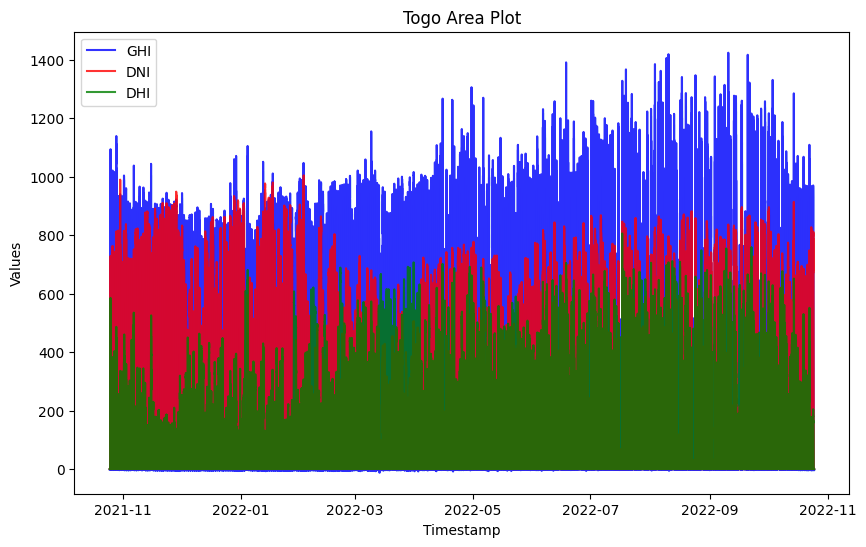

In [15]:
plot_area(benin_data, 'Benin Area Plot')
plot_area(sierraleone_data, 'Sierra Leone Area Plot')
plot_area(togo_data, 'Togo Area Plot')

/tmp/ipykernel_9344/3547454457.py:9: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  data['Period'] = data[cleaning_col].shift(1).fillna(False).astype(int).cumsum()
/tmp/ipykernel_9344/3547454457.py:32: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


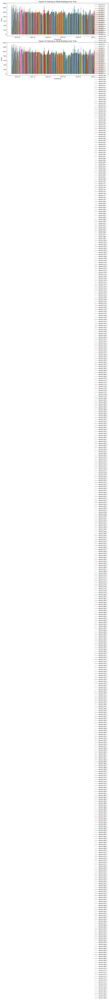

Mean Before Cleaning:
 ModA    236.524253
ModB    228.816071
dtype: float64
Mean After Cleaning:
 ModA    307.229278
ModB    301.972165
dtype: float64


NameError: name 'ttest_ind' is not defined

In [16]:


def evaluate_cleaning_impact(data, timestamp_col='Timestamp', cleaning_col='Cleaning', modA_col='ModA', modB_col='ModB'):
    # Convert 'Timestamp' to datetime
    data[timestamp_col] = pd.to_datetime(data[timestamp_col])

    # Ensure 'Cleaning' is a boolean column
    data[cleaning_col] = data[cleaning_col].astype(bool)

    # Create a period column to indicate before and after cleaning
    data['Period'] = data[cleaning_col].shift(1).fillna(False).astype(int).cumsum()

    # Plot ModA and ModB over time, colored by cleaning period
    plt.figure(figsize=(14, 10))

    # Plot ModA readings
    plt.subplot(2, 1, 1)
    for key, grp in data.groupby(['Period']):
        plt.plot(grp[timestamp_col], grp[modA_col], label=f'Period {key}')
    plt.title(f'Impact of Cleaning on {modA_col} Readings Over Time')
    plt.xlabel('Timestamp')
    plt.ylabel(modA_col)
    plt.legend()

    # Plot ModB readings
    plt.subplot(2, 1, 2)
    for key, grp in data.groupby(['Period']):
        plt.plot(grp[timestamp_col], grp[modB_col], label=f'Period {key}')
    plt.title(f'Impact of Cleaning on {modB_col} Readings Over Time')
    plt.xlabel('Timestamp')
    plt.ylabel(modB_col)
    plt.legend()

    plt.tight_layout()
    plt.show()

    # Calculate and display mean before and after cleaning
    mean_before_cleaning = data.loc[data[cleaning_col] == False, [modA_col, modB_col]].mean()
    mean_after_cleaning = data.loc[data[cleaning_col] == True, [modA_col, modB_col]].mean()
    print("Mean Before Cleaning:\n", mean_before_cleaning)
    print("Mean After Cleaning:\n", mean_after_cleaning)

    # Conduct a T-Test
    before_cleaning = data.loc[data[cleaning_col] == False, [modA_col, modB_col]]
    after_cleaning = data.loc[data[cleaning_col] == True, [modA_col, modB_col]]

    t_stat, p_value = ttest_ind(before_cleaning, after_cleaning)
    print(f"T-Statistic: {t_stat}, P-Value: {p_value}")

# Example usage with your data
evaluate_cleaning_impact(benin_data, timestamp_col='Timestamp', cleaning_col='Cleaning', modA_col='ModA', modB_col='ModB')
evaluate_cleaning_impact(sierraleone_data, timestamp_col='Timestamp', cleaning_col='Cleaning', modA_col='ModA', modB_col='ModB')
evaluate_cleaning_impact(togo_data, timestamp_col='Timestamp', cleaning_col='Cleaning', modA_col='ModA', modB_col='ModB')

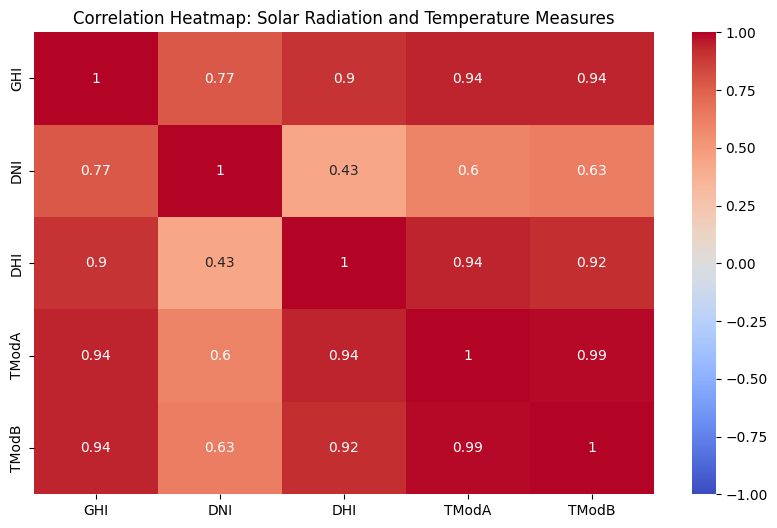

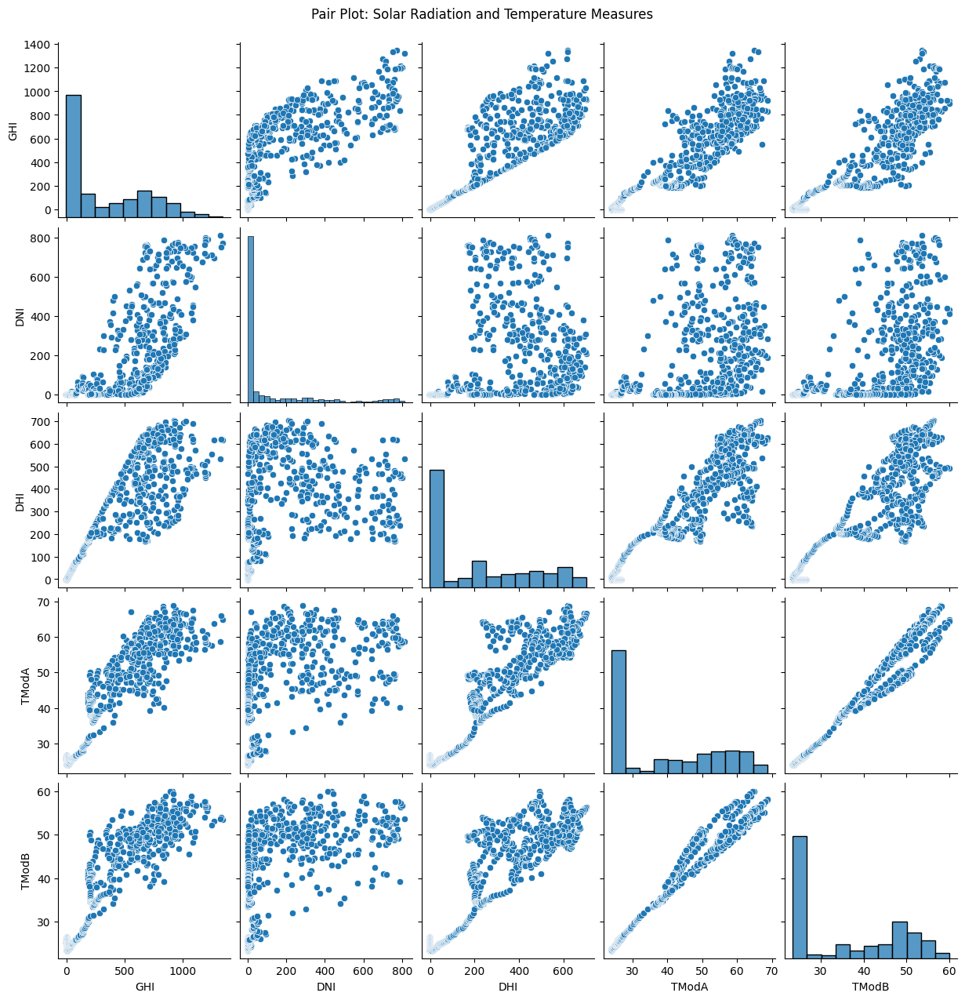

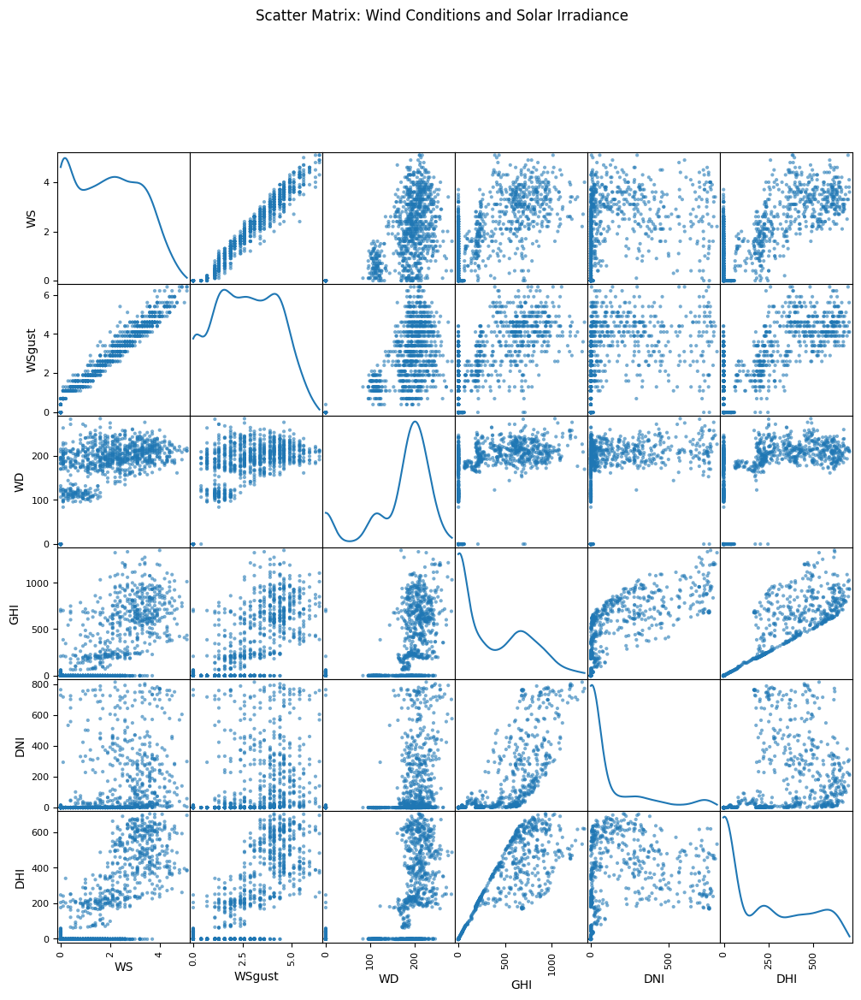

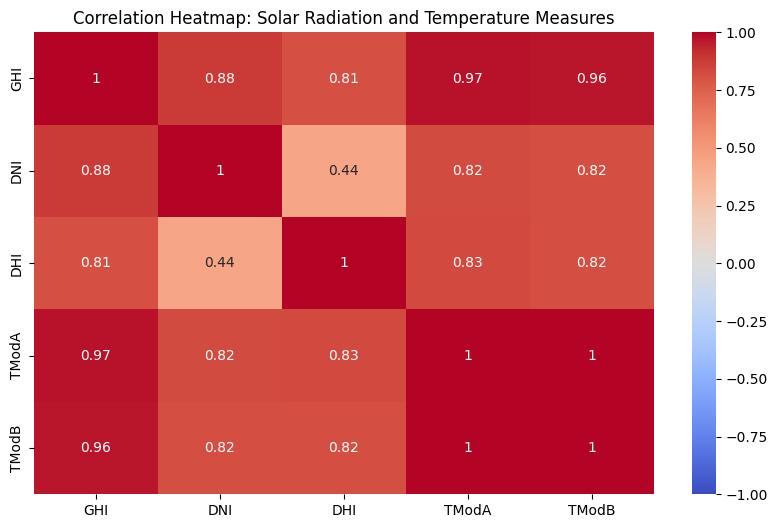

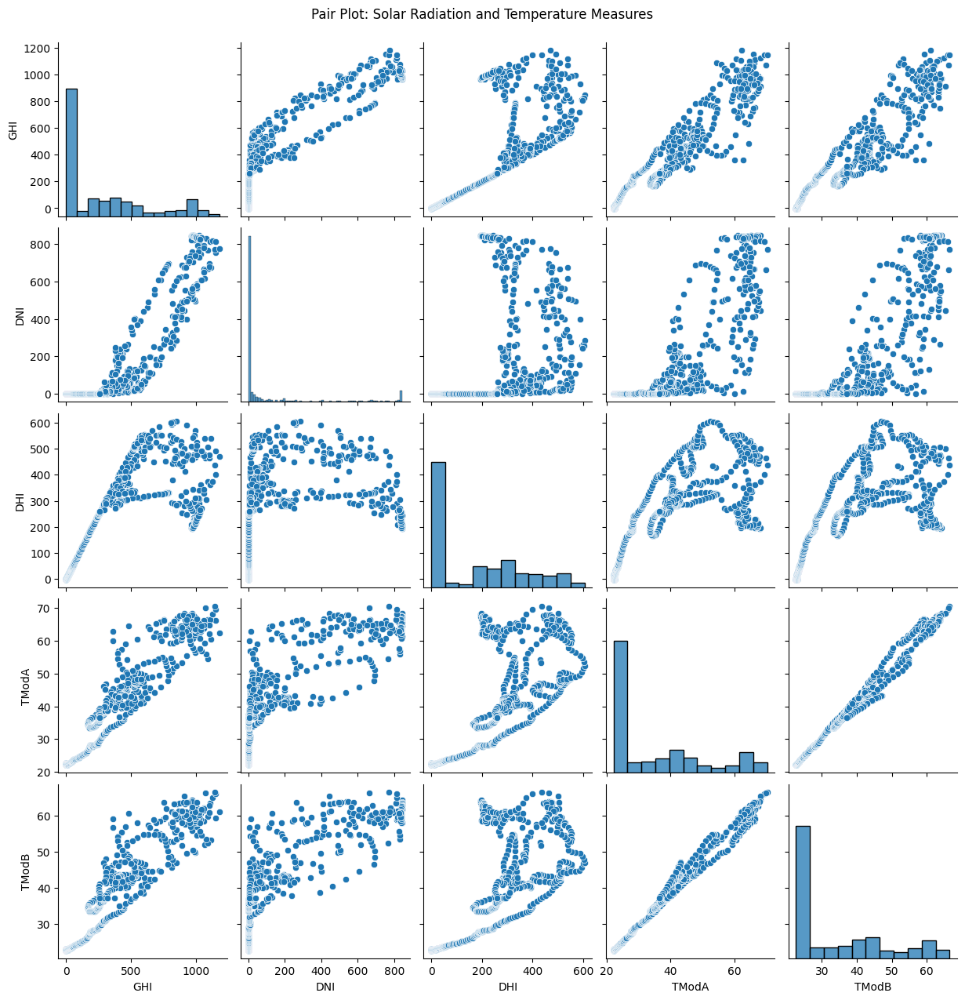

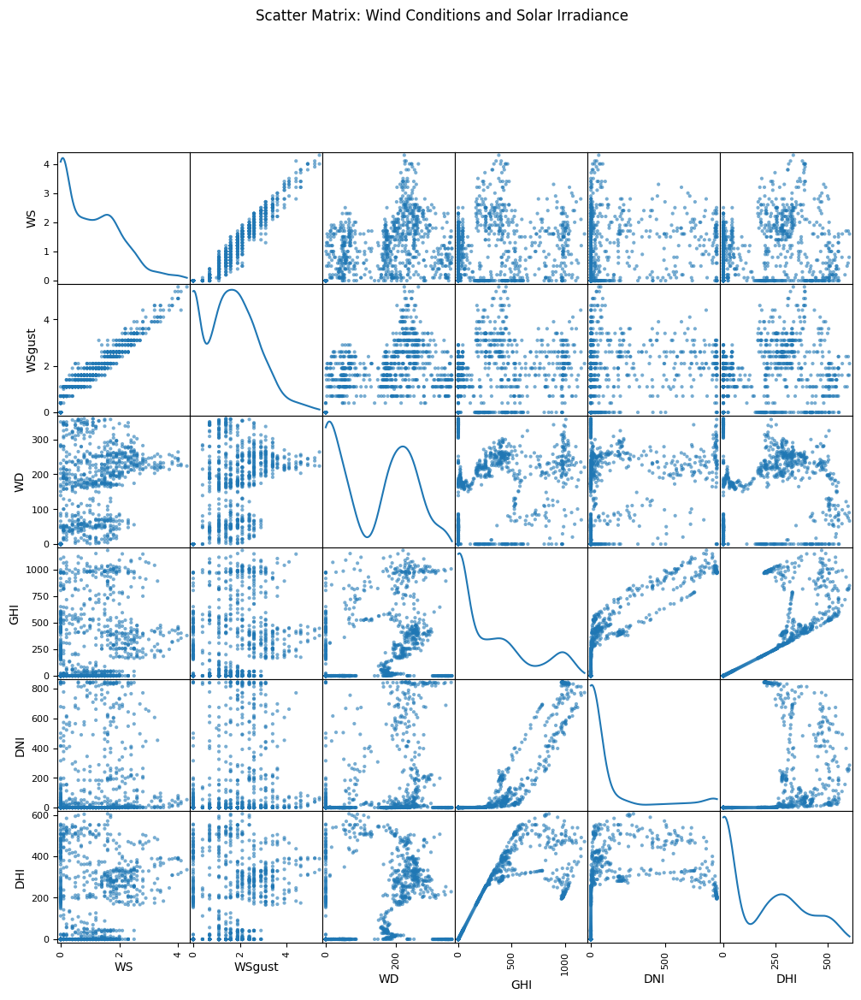

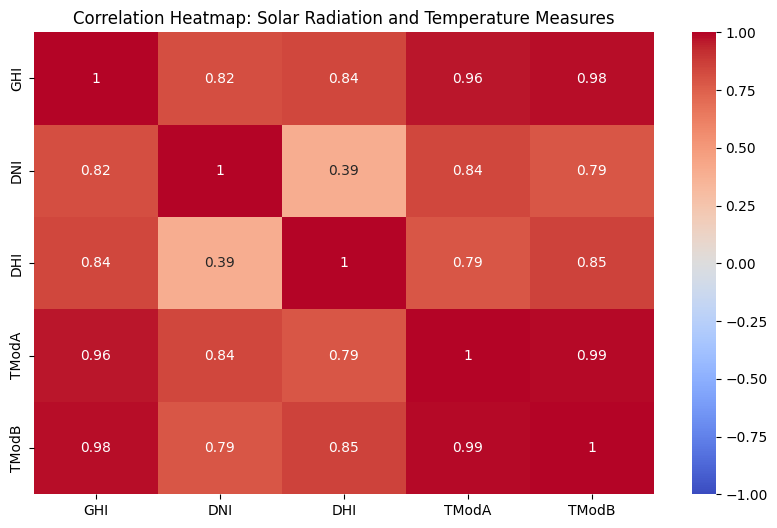

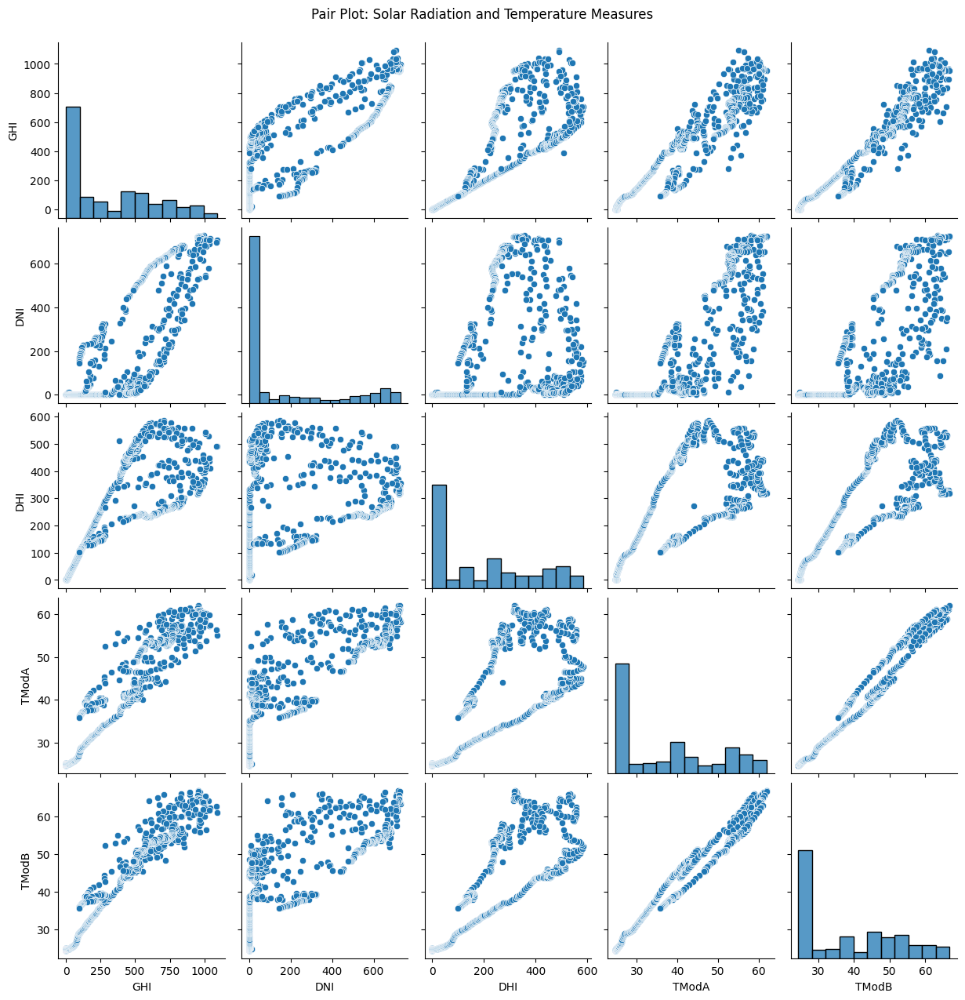

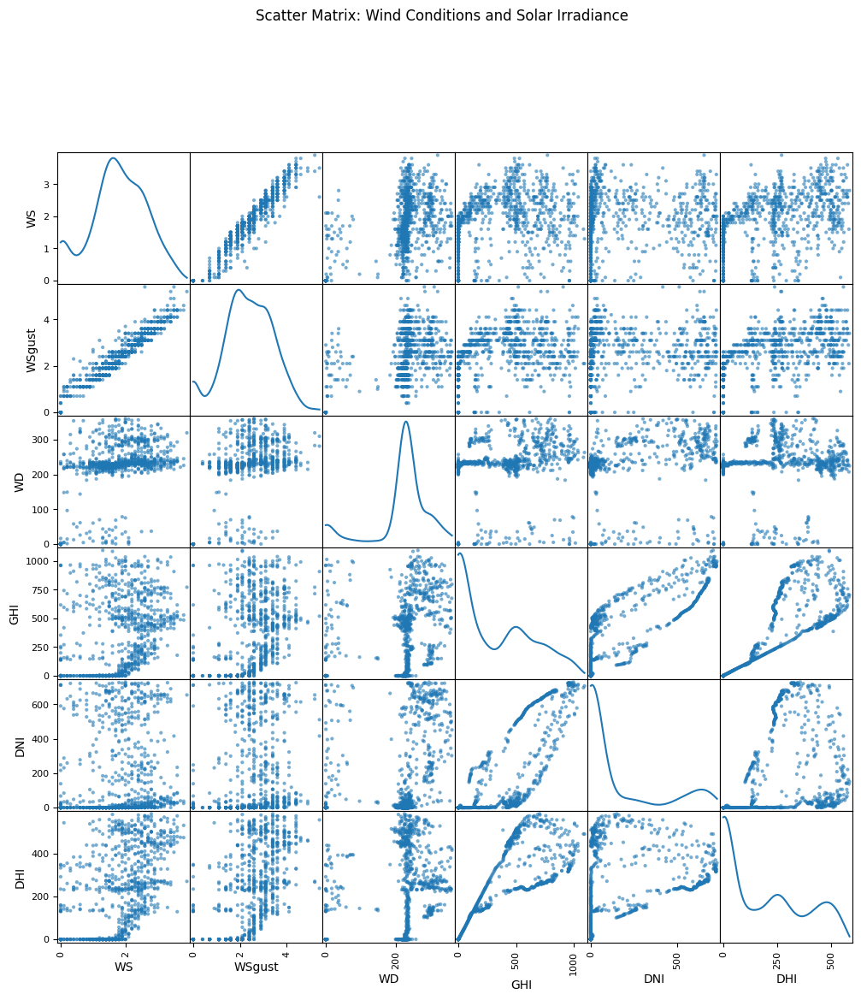

In [ ]:
def correlation_analysis(data):
    data = data.head(1000)
    # Select relevant columns
    solar_temp_columns = ['GHI', 'DNI', 'DHI', 'TModA', 'TModB']
    wind_columns = ['WS', 'WSgust', 'WD']

    # Calculate the correlation matrix for solar radiation and temperature measures
    solar_temp_corr = data[solar_temp_columns].corr()

    # Plot the heatmap for the correlation matrix
    plt.figure(figsize=(10, 6))
    sns.heatmap(solar_temp_corr, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
    plt.title('Correlation Heatmap: Solar Radiation and Temperature Measures')
    plt.show()

    # Pair plot for visualizing relationships
    sns.pairplot(data[solar_temp_columns])
    plt.suptitle('Pair Plot: Solar Radiation and Temperature Measures', y=1.02)
    plt.show()

    # Scatter matrices for wind conditions and solar irradiance
    scatter_matrix(data[wind_columns + ['GHI', 'DNI', 'DHI']], figsize=(12, 12), diagonal='kde', alpha=0.6)
    plt.suptitle('Scatter Matrix: Wind Conditions and Solar Irradiance', y=1.02)
    plt.show()

# Example usage with your data
correlation_analysis(benin_data)
correlation_analysis(sierraleone_data)
correlation_analysis(togo_data)

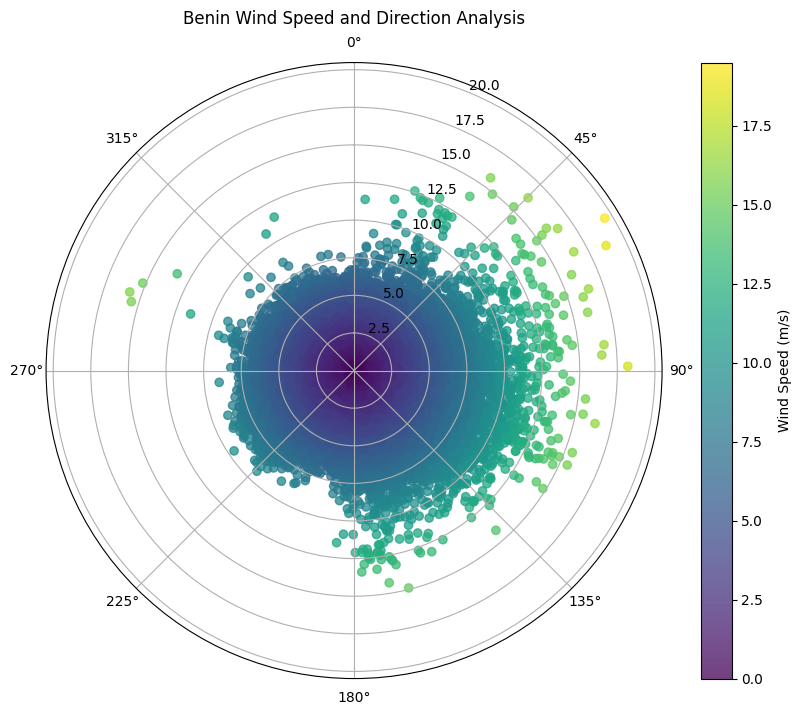

Wind Direction Variability (Standard Deviation): 102.33 degrees


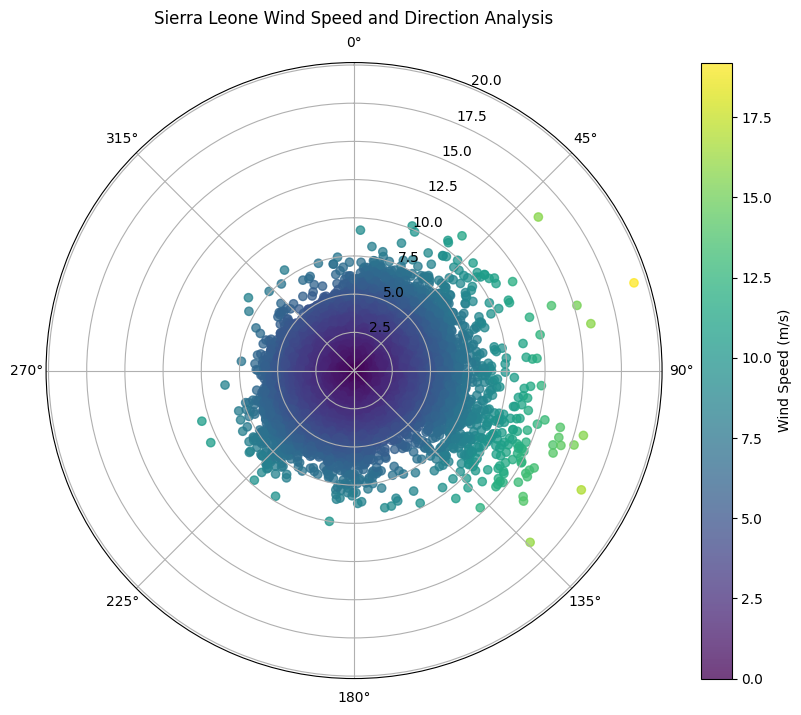

Wind Direction Variability (Standard Deviation): 114.28 degrees


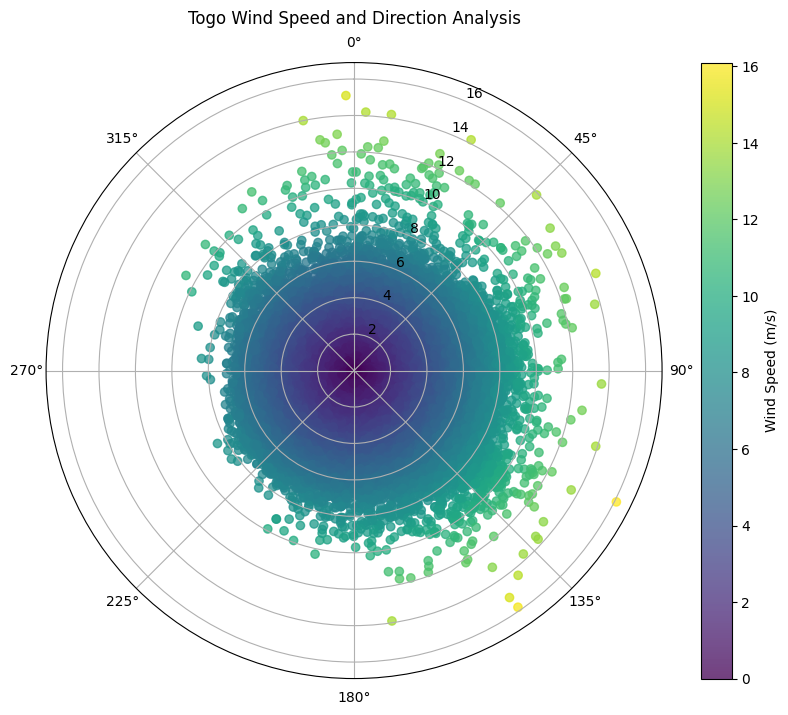

Wind Direction Variability (Standard Deviation): 91.88 degrees


In [ ]:
def wind_analysis(data, ws_col='WS', wd_col='WD', title='Wind Speed and Direction Analysis'):
    # Convert wind direction from degrees to radians
    data['Wind_Direction_Radians'] = np.deg2rad(data[wd_col])

    # Create a polar plot
    plt.figure(figsize=(10, 8))
    ax = plt.subplot(111, polar=True)
    
    # Scatter plot of wind speed and direction
    sc = ax.scatter(data['Wind_Direction_Radians'], data[ws_col], 
                    c=data[ws_col], cmap='viridis', alpha=0.75)

    # Add a colorbar for wind speed
    plt.colorbar(sc, label='Wind Speed (m/s)')

    # Set plot title and labels
    ax.set_title(title, va='bottom')
    ax.set_theta_zero_location('N')  # Set 0 degrees at North
    ax.set_theta_direction(-1)       # Set degrees to increase clockwise

    # Show the plot
    plt.show()

    # Analysis of variability in wind direction
    wind_direction_variability = data[wd_col].std()
    print(f"Wind Direction Variability (Standard Deviation): {wind_direction_variability:.2f} degrees")

# Example usage with your data
wind_analysis(benin_data, ws_col='WS', wd_col='WD', title='Benin Wind Speed and Direction Analysis')
wind_analysis(sierraleone_data, ws_col='WS', wd_col='WD', title='Sierra Leone Wind Speed and Direction Analysis')
wind_analysis(togo_data, ws_col='WS', wd_col='WD', title='Togo Wind Speed and Direction Analysis')

Temperature Analysis for Benin:


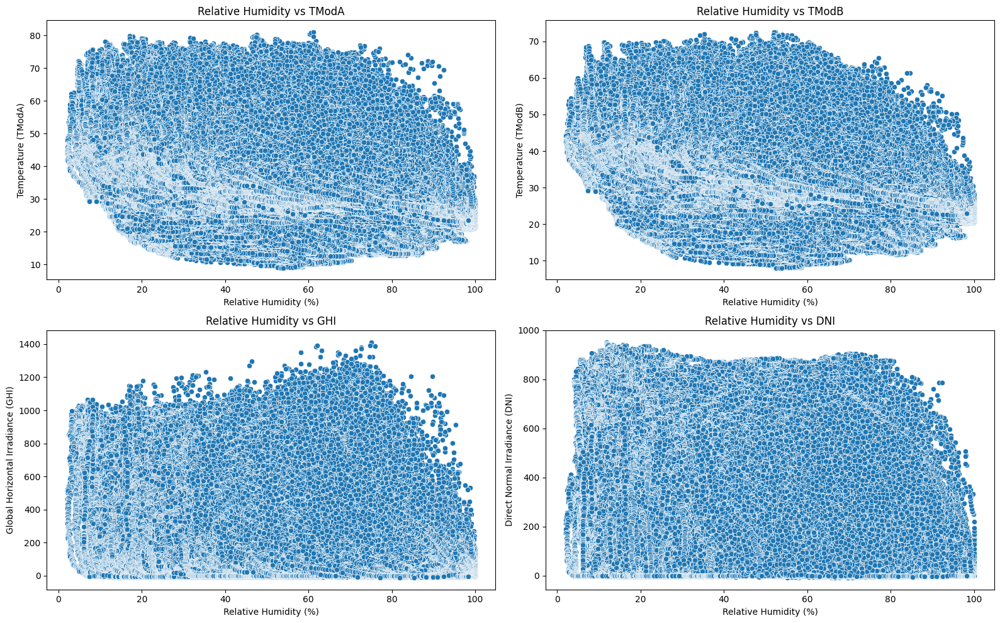

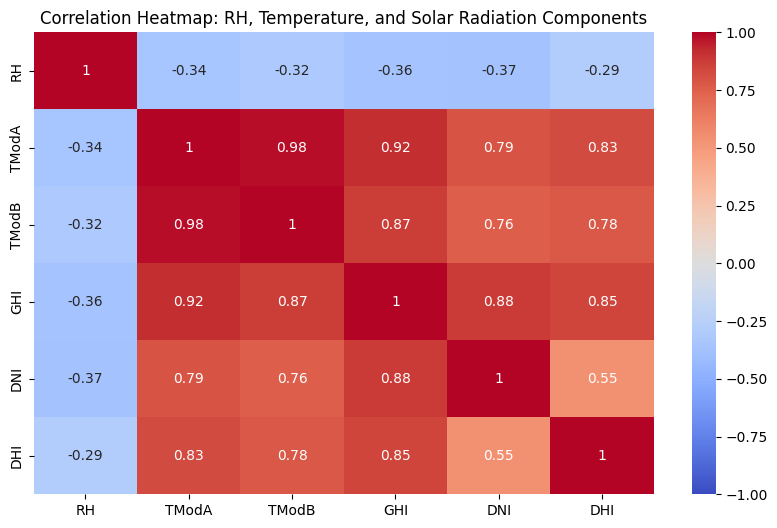

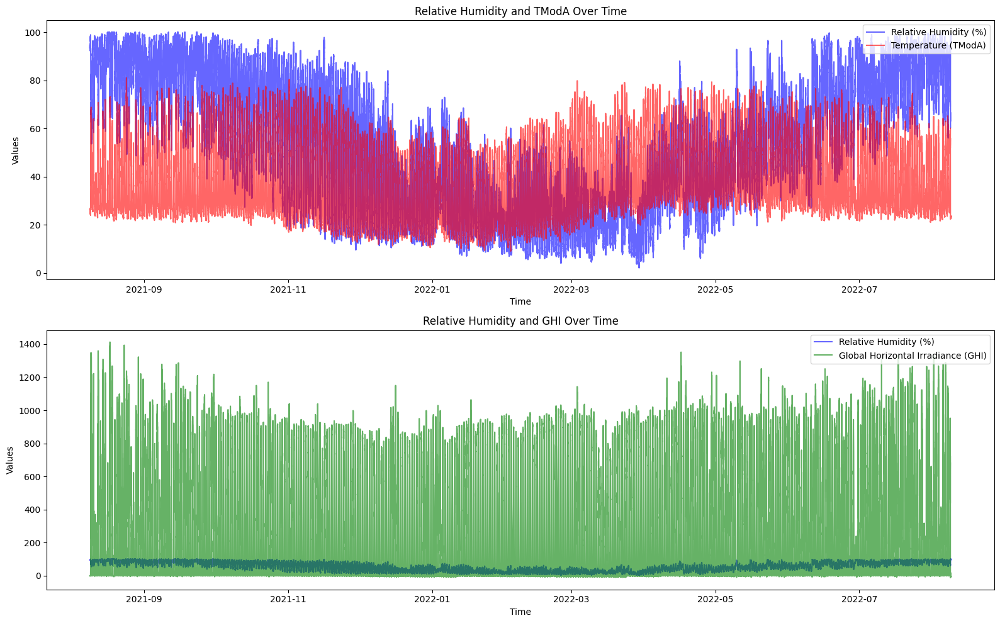

Temperature Analysis for Sierra Leone:


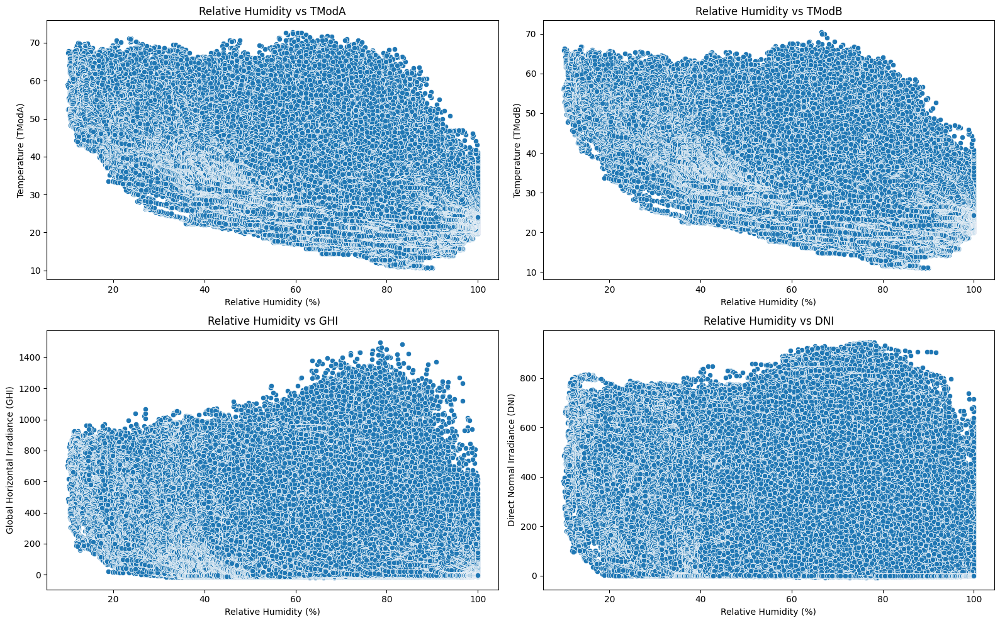

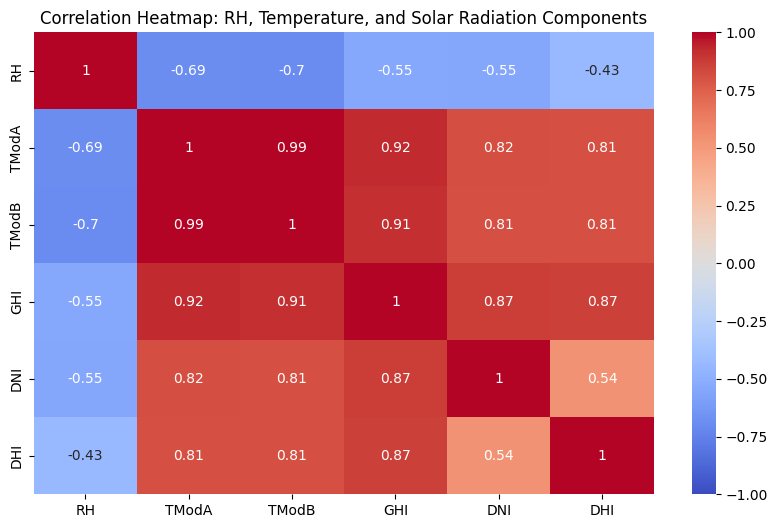

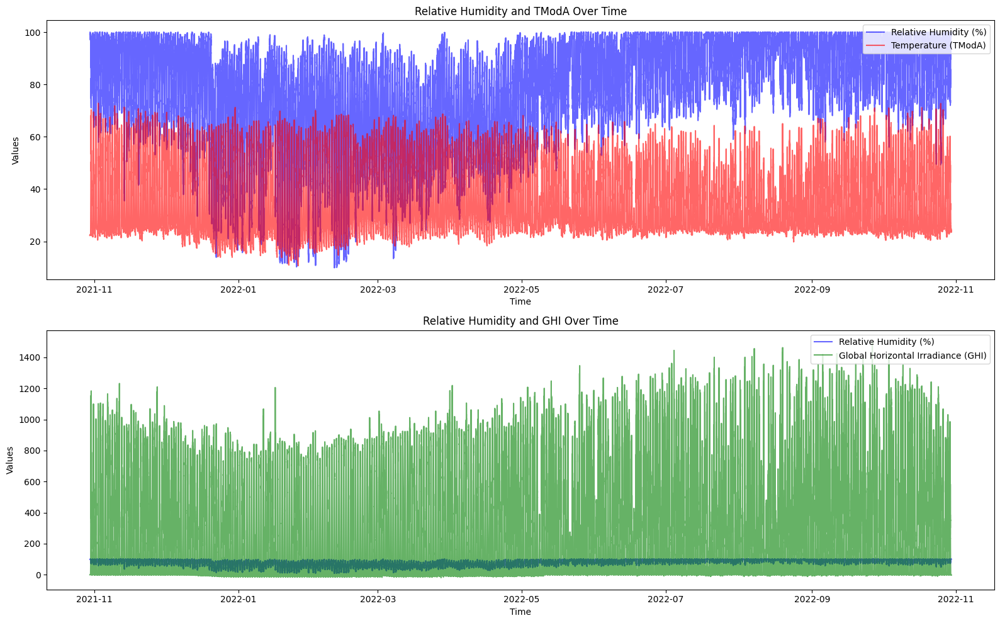

Temperature Analysis for Togo:


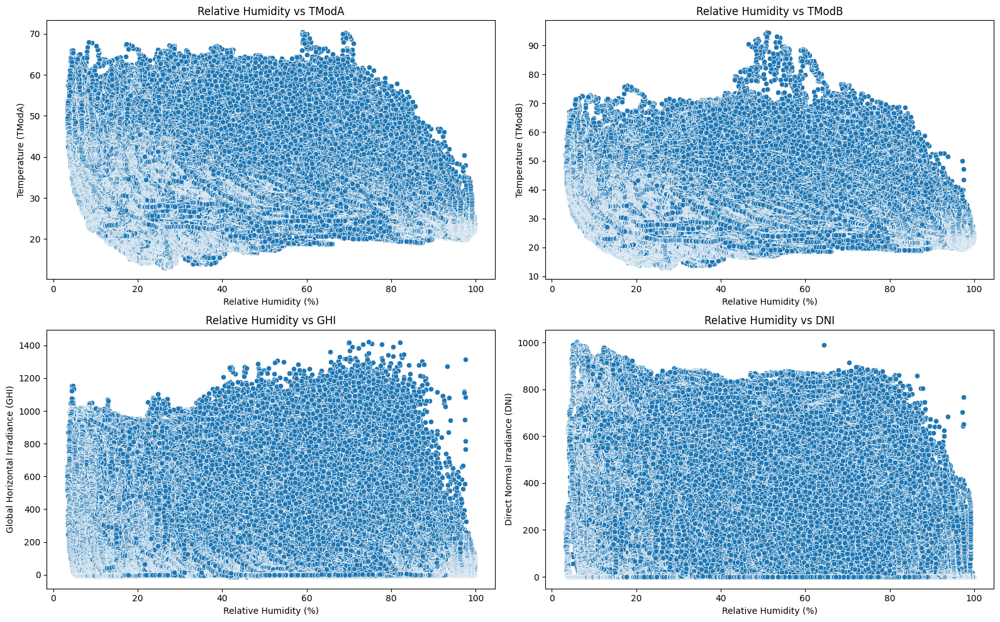

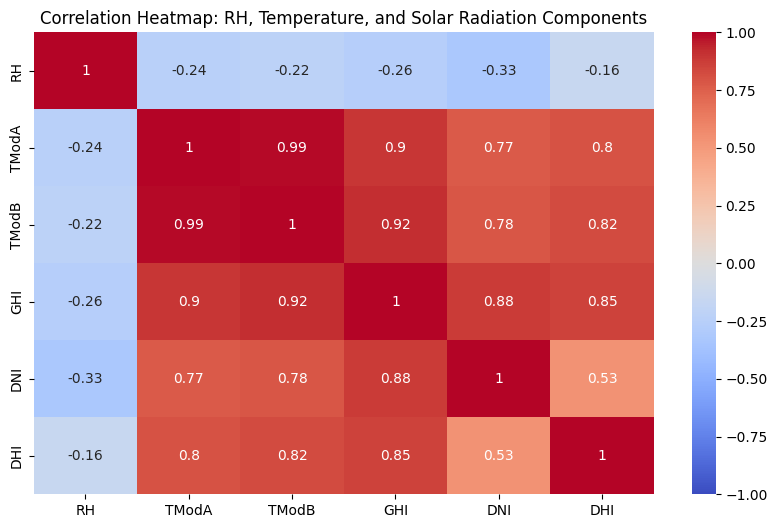

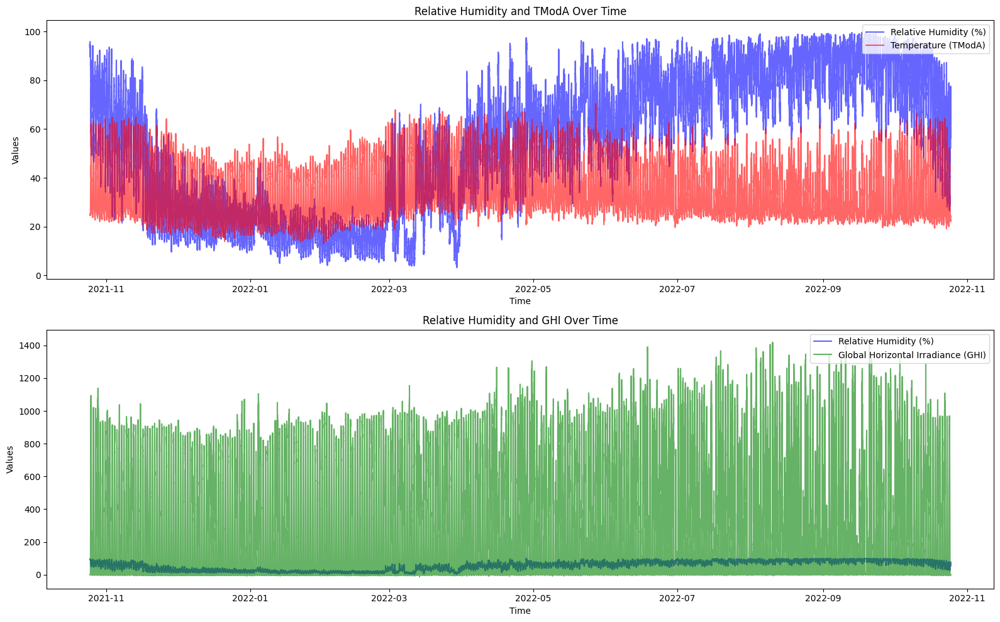

In [ ]:
def temperature_analysis(data):
    # Scatter plots: RH vs Temperature, RH vs Solar Radiation
    plt.figure(figsize=(16, 10))

    # RH vs TModA
    plt.subplot(2, 2, 1)
    sns.scatterplot(x=data['RH'], y=data['TModA'])
    plt.title('Relative Humidity vs TModA')
    plt.xlabel('Relative Humidity (%)')
    plt.ylabel('Temperature (TModA)')

    # RH vs TModB
    plt.subplot(2, 2, 2)
    sns.scatterplot(x=data['RH'], y=data['TModB'])
    plt.title('Relative Humidity vs TModB')
    plt.xlabel('Relative Humidity (%)')
    plt.ylabel('Temperature (TModB)')

    # RH vs GHI
    plt.subplot(2, 2, 3)
    sns.scatterplot(x=data['RH'], y=data['GHI'])
    plt.title('Relative Humidity vs GHI')
    plt.xlabel('Relative Humidity (%)')
    plt.ylabel('Global Horizontal Irradiance (GHI)')

    # RH vs DNI
    plt.subplot(2, 2, 4)
    sns.scatterplot(x=data['RH'], y=data['DNI'])
    plt.title('Relative Humidity vs DNI')
    plt.xlabel('Relative Humidity (%)')
    plt.ylabel('Direct Normal Irradiance (DNI)')

    plt.tight_layout()
    plt.show()

    # Correlation matrix for RH, Temperature, and Solar Radiation components
    corr_matrix = data[['RH', 'TModA', 'TModB', 'GHI', 'DNI', 'DHI']].corr()

    plt.figure(figsize=(10, 6))
    sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
    plt.title('Correlation Heatmap: RH, Temperature, and Solar Radiation Components')
    plt.show()

    # Trend Analysis with Line Plots
    plt.figure(figsize=(16, 10))

    # RH and TModA over time
    plt.subplot(2, 1, 1)
    plt.plot(data['Timestamp'], data['RH'], label='Relative Humidity (%)', color='blue', alpha=0.6)
    plt.plot(data['Timestamp'], data['TModA'], label='Temperature (TModA)', color='red', alpha=0.6)
    plt.legend(loc='upper right')
    plt.title('Relative Humidity and TModA Over Time')
    plt.xlabel('Time')
    plt.ylabel('Values')

    # RH and GHI over time
    plt.subplot(2, 1, 2)
    plt.plot(data['Timestamp'], data['RH'], label='Relative Humidity (%)', color='blue', alpha=0.6)
    plt.plot(data['Timestamp'], data['GHI'], label='Global Horizontal Irradiance (GHI)', color='green', alpha=0.6)
    plt.legend(loc='upper right')
    plt.title('Relative Humidity and GHI Over Time')
    plt.xlabel('Time')
    plt.ylabel('Values')

    plt.tight_layout()
    plt.show()

# Example usage with your data

print('Temperature Analysis for Benin:')
temperature_analysis(benin_data)

print('Temperature Analysis for Sierra Leone:')
temperature_analysis(sierraleone_data)

print('Temperature Analysis for Togo:')
temperature_analysis(togo_data)


Histograms for Benin:


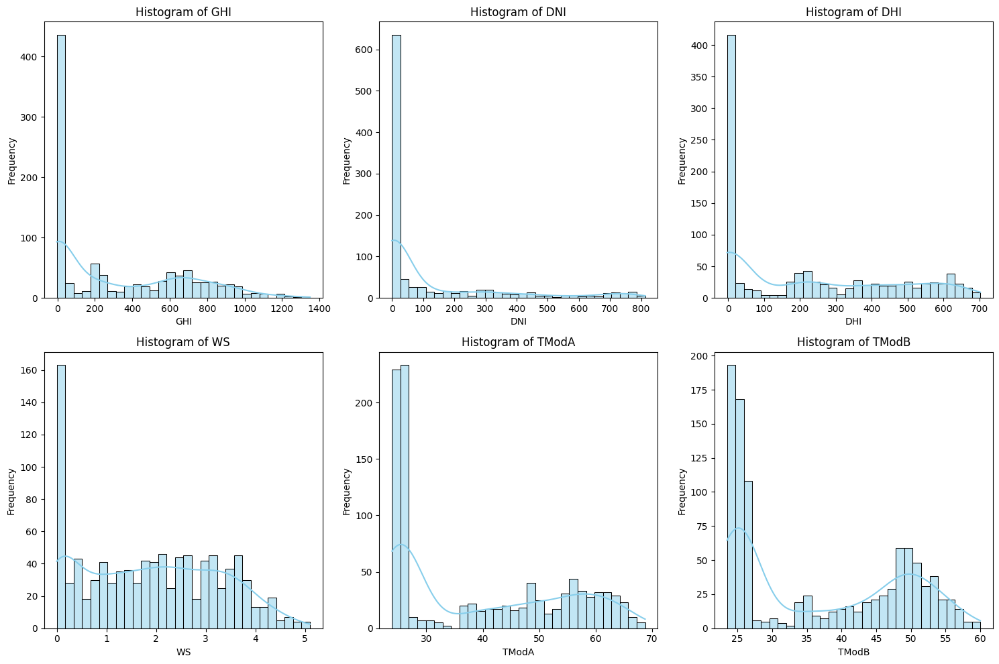

Histograms for Sierra Leone:


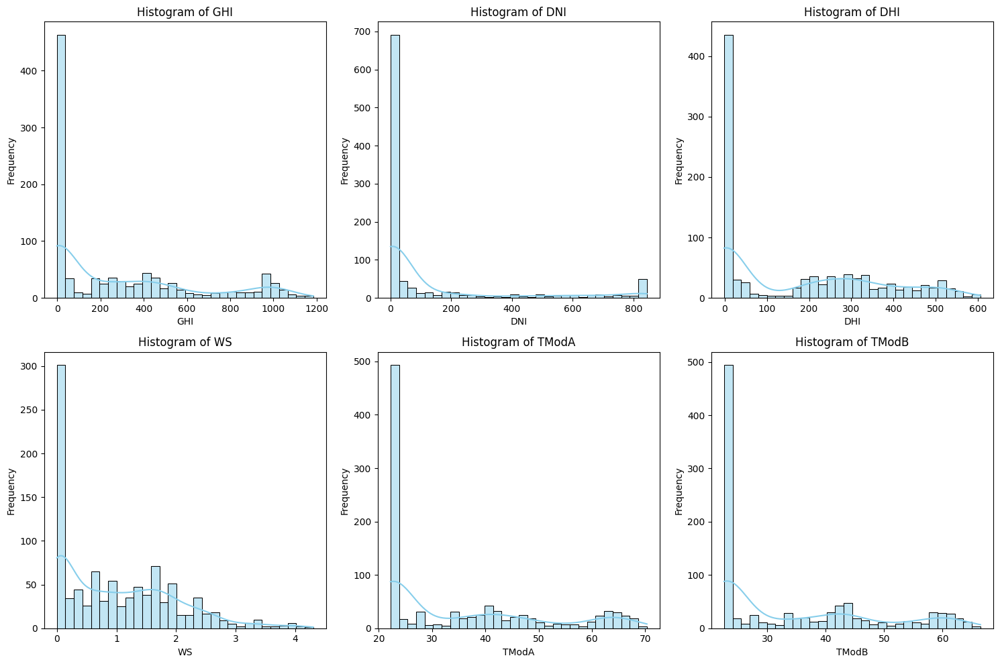

Histograms for Togo:


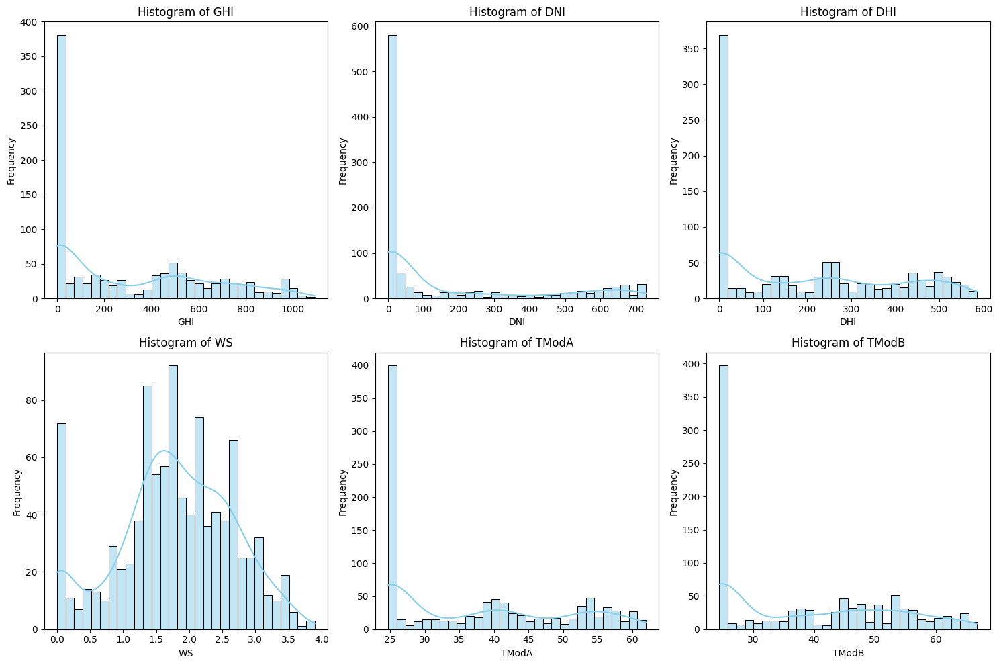

In [ ]:
def plot_histograms(data):
    # List of variables to plot
    data = data.head(1000)
    variables = ['GHI', 'DNI', 'DHI', 'WS', 'TModA', 'TModB']
    
    # Set the size of the overall figure
    plt.figure(figsize=(15, 10))

    # Loop through the variables and create a histogram for each
    for i, var in enumerate(variables, start=1):
        plt.subplot(2, 3, i)
        sns.histplot(data[var], kde=True, bins=30, color='skyblue')
        plt.title(f'Histogram of {var}')
        plt.xlabel(var)
        plt.ylabel('Frequency')

    # Adjust the layout to avoid overlap
    plt.tight_layout()
    plt.show()

# Example usage with your data
print('Histograms for Benin:')
plot_histograms(benin_data)

print('Histograms for Sierra Leone:')
plot_histograms(sierraleone_data)

print('Histograms for Togo:')
plot_histograms(togo_data)


In [ ]:
def calculate_z_scores(data, threshold=3):
    # List of variables to analyze
    data = data.head(1000)
    variables = ['GHI', 'DNI', 'DHI', 'WS', 'TModA', 'TModB']
    
    # Create a dictionary to hold Z-scores
    z_scores = {}

    # Calculate Z-scores for each variable
    for var in variables:
        z_scores[var] = (data[var] - data[var].mean()) / data[var].std()

    # Convert the dictionary to a DataFrame for better handling
    z_scores_df = pd.DataFrame(z_scores)
    
    # Flagging the data points with Z-scores beyond the threshold
    outliers = (z_scores_df.abs() > threshold)

    # Printing the flagged data points (outliers)
    for var in variables:
        print(f"\nOutliers in {var}:")
        print(data[outliers[var]])

    return z_scores_df, outliers

# Example usage with your data
print('Z-Scores and Outliers for Benin:')
z_scores_df, outliers = calculate_z_scores(benin_data)

print('Z-Scores and Outliers for Sierra Leone:')
z_scores_df, outliers = calculate_z_scores(sierraleone_data)

print('Z-Scores and Outliers for Togo:')
z_scores_df, outliers = calculate_z_scores(togo_data)


Z-Scores and Outliers for Benin:

Outliers in GHI:
                 Timestamp     GHI    DNI    DHI    ModA    ModB  Tamb    RH  \
671    2021-08-09 11:12:00  1274.0  698.8  615.2  1210.3  1210.3  30.1  69.6   
674    2021-08-09 11:15:00  1349.0  771.8  618.0  1281.5  1281.5  30.9  67.1   
676    2021-08-09 11:17:00  1334.0  751.9  620.0  1267.3  1267.3  31.1  67.0   
849    2021-08-09 14:10:00  1253.0  714.8  552.5  1156.0  1155.0  31.0  64.2   
850    2021-08-09 14:11:00  1324.0  813.0  532.3  1218.0  1217.0  31.0  62.9   
...                    ...     ...    ...    ...     ...     ...   ...   ...   
517777 2022-08-03 13:38:00  1268.0  652.5  612.1  1163.0  1150.0  30.1  70.7   
520659 2022-08-05 13:40:00  1280.0  778.5  497.2  1168.0  1161.0  29.0  70.3   
520696 2022-08-05 14:17:00  1244.0  745.2  530.4  1126.0  1118.0  30.8  64.3   
522074 2022-08-06 13:15:00  1262.0  772.4  475.8  1166.0  1153.0  31.1  66.0   
522075 2022-08-06 13:16:00  1289.0  758.1  519.2  1191.0  1179.0  31.

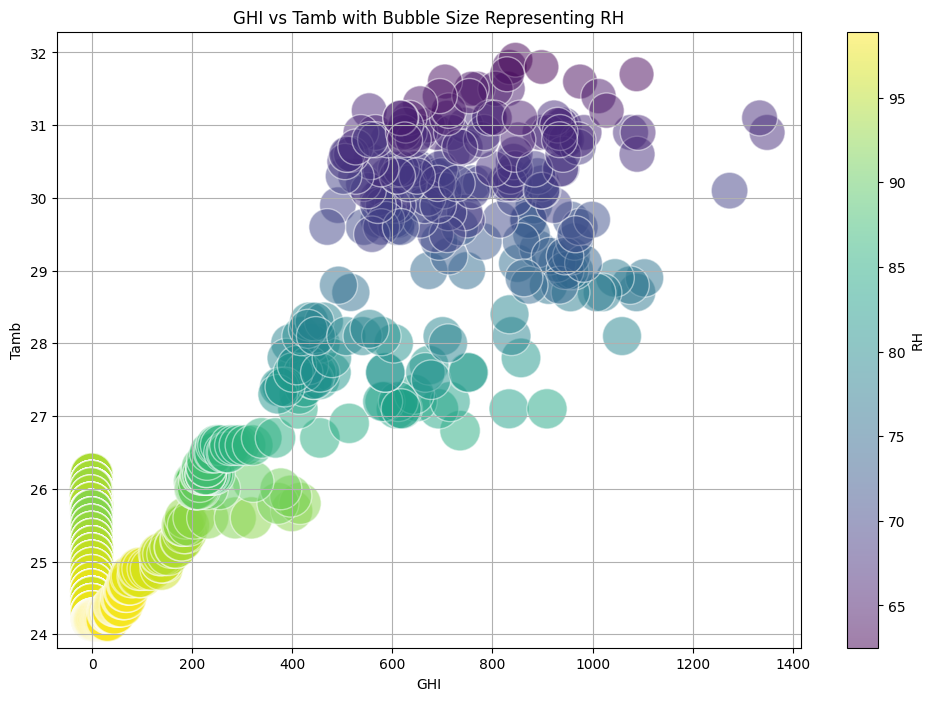

Bubble Chart for Benin:


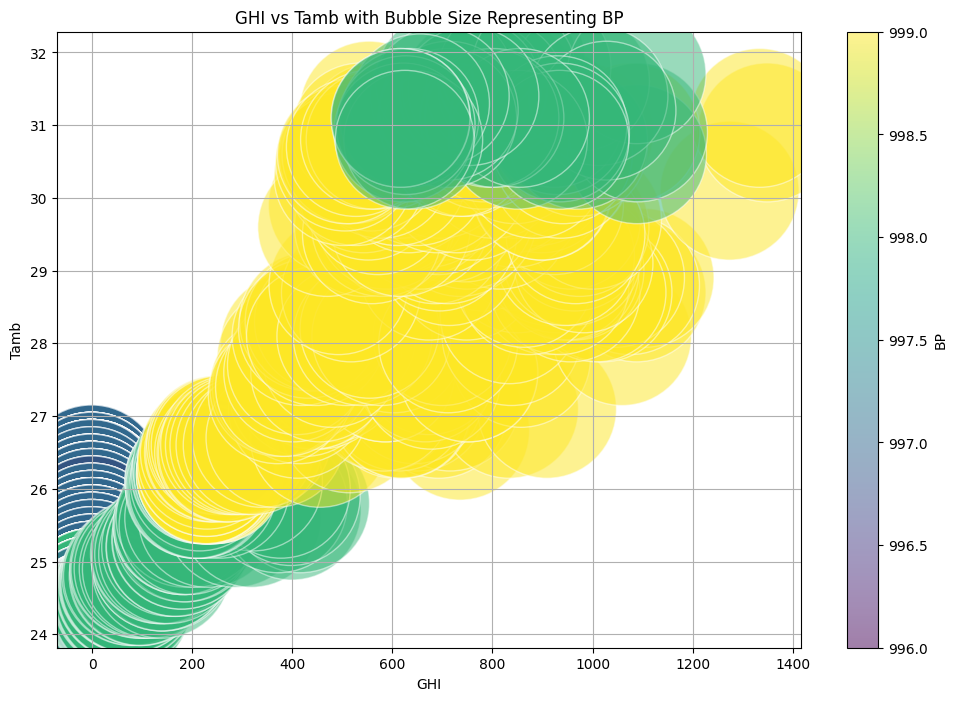

Bubble Chart for Sierra Leone:


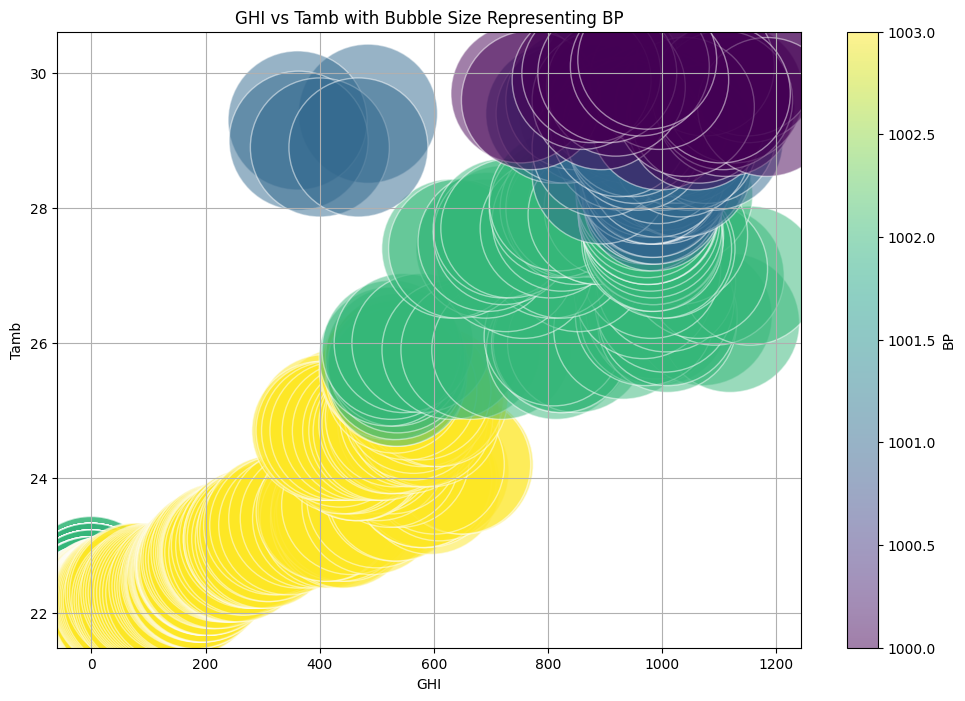

Bubble Chart for Togo:


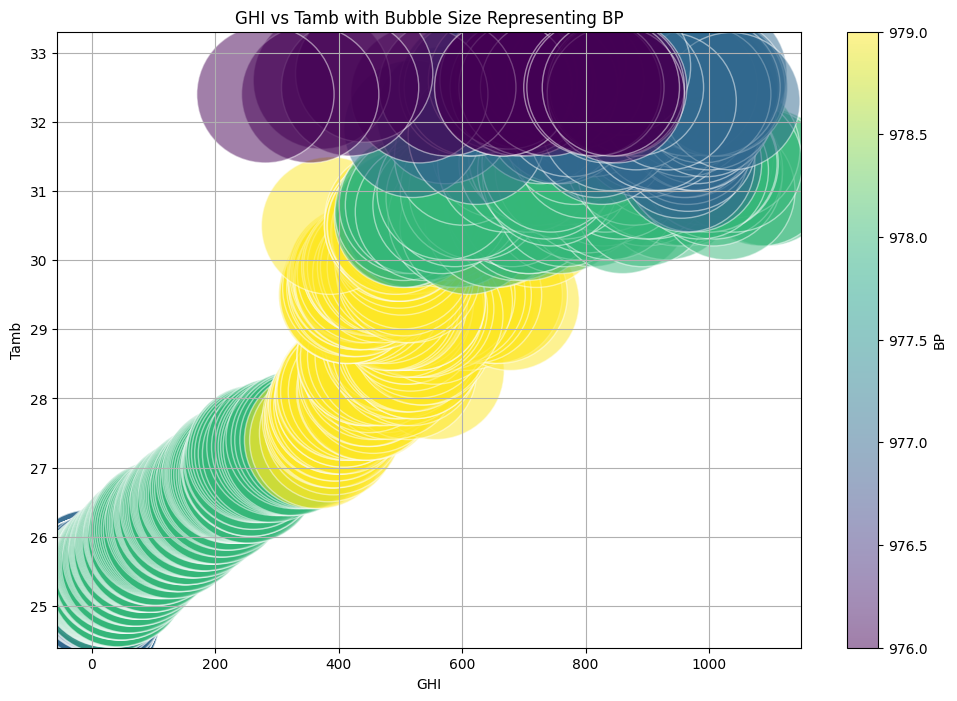

In [ ]:
def plot_bubble_chart(data, x_var, y_var, size_var, title):
    data = data.head(800)
    plt.figure(figsize=(12, 8))

    # Plotting the bubble chart
    plt.scatter(
        data[x_var], 
        data[y_var], 
        s=data[size_var] * 10,  # Bubble size; adjust multiplier for scaling
        alpha=0.5, 
        c=data[size_var],  # Color by size_var
        cmap='viridis',    # Color map for bubbles
        edgecolors='w'
    )
    
    plt.title(title)
    plt.xlabel(x_var)
    plt.ylabel(y_var)
    plt.colorbar(label=size_var)  # Show color bar representing the size_var
    plt.grid(True)
    plt.show()

# Example usage with your data
# Plotting GHI vs Tamb with bubble size representing RH
plot_bubble_chart(benin_data, 'GHI', 'Tamb', 'RH', 'GHI vs Tamb with Bubble Size Representing RH')

# Plotting GHI vs Tamb with bubble size representing BP
print('Bubble Chart for Benin:')
plot_bubble_chart(benin_data, 'GHI', 'Tamb', 'BP', 'GHI vs Tamb with Bubble Size Representing BP')

print('Bubble Chart for Sierra Leone:')
plot_bubble_chart(sierraleone_data, 'GHI', 'Tamb', 'BP', 'GHI vs Tamb with Bubble Size Representing BP')

print('Bubble Chart for Togo:')
plot_bubble_chart(togo_data, 'GHI', 'Tamb', 'BP', 'GHI vs Tamb with Bubble Size Representing BP')

In [ ]:
def clean_dataset(data):
    # Display initial info about missing values
    print("Initial Missing Values:")
    print(data.isnull().sum())

    # Drop columns that are entirely null
    columns_to_drop = data.columns[data.isnull().all()]
    data = data.drop(columns=columns_to_drop)
    print(f"\nDropped columns: {list(columns_to_drop)}")

    # Drop rows with missing values in critical columns (if any)
    critical_columns = ['GHI', 'DNI', 'DHI', 'TModA', 'TModB']  # Adjust based on critical columns
    data = data.dropna(subset=critical_columns)
    print(f"\nDropped rows with missing critical columns. Remaining rows: {len(data)}")

    # Handle missing values in non-critical columns with imputation or placeholders
    # Example: Fill missing values in 'Comments' with 'No Comment'
    if 'Comments' in data.columns:
        data['Comments'] = data['Comments'].fillna('No Comment')

    # Handling anomalies - Example: Remove rows with outlier values in specific columns
    for col in ['GHI', 'DNI', 'DHI', 'WS', 'TModA', 'TModB']:
        if col in data.columns:
            # Define a function to detect outliers (e.g., Z-score method)
            z_scores = (data[col] - data[col].mean()) / data[col].std()
            data = data[(z_scores.abs() < 3)]  

    print("\nData Cleaning Completed")
    print("Data Info after Cleaning:")
    print(data.info())

    return data

# Example usage with your data
print('Cleaning Benin Data:')
cleaned_benin_data = clean_dataset(benin_data)

print('Cleaning Sierra Leone Data:')
cleaned_sierraleone_data = clean_dataset(sierraleone_data)

print('Cleaning Togo Data:')
cleaned_togo_data = clean_dataset(togo_data)


Cleaning Benin Data:
Initial Missing Values:
Timestamp                      0
GHI                            0
DNI                            0
DHI                            0
ModA                           0
ModB                           0
Tamb                           0
RH                             0
WS                             0
WSgust                         0
WSstdev                        0
WD                             0
WDstdev                        0
BP                             0
Cleaning                       0
Precipitation                  0
TModA                          0
TModB                          0
Comments                  525600
time                           0
Period                         0
Wind_Direction_Radians         0
dtype: int64

Dropped columns: ['Comments']

Dropped rows with missing critical columns. Remaining rows: 525600

Data Cleaning Completed
Data Info after Cleaning:
<class 'pandas.core.frame.DataFrame'>
Index: 518550 entries, 0 to 